**Nama Peserta:**

* Ammar Ridwan Darma 
* Alif Adwitiya Pratama
* Nur Imam Masri

**Universitas Host:**

Universitas Gajah Mada


**Kelas:**

UGM-01


**Kelompok:** 1


**Tema Project Kelompok:**  

Iklim Cuaca

# **import libraries**

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns

# import Library SelectKBest
from sklearn.feature_selection import SelectKBest

# import Library chi kuadrat/squared
from sklearn.feature_selection import chi2

In [ ]:
plt.style.use('seaborn')

# **Data Loading**


[Data Prakiraan Cuaca Wilayah Provinsi DKI Jakarta Tahun 2018](https://data.jakarta.go.id/dataset/data-prakiraan-cuaca-wilayah-provinsi-dki-jakarta-tahun-2018)

[Data Prakiraan Cuaca Wilayah Provinsi DKI Jakarta Tahun 2017](https://data.jakarta.go.id/dataset/data-prakiraan-cuaca-wilayah-provinsi-dki-jakarta-tahun-2017)


### **Attribute Information**

Dataset ini berisi Prakiraan Cuaca di Wilayah Provinsi DKI Jakarta tiap bulannya pada Tahun 2018.

Penjelasan mengenai variabel pada dataset ini :

1. tanggal.
2. wilayah
3. waktu.
4. cuaca
5. kelembaban_persen,
6. suhu_derajat_celcius

**Metadata :**

* Terakhir Diperbarui : 21 Januari 2019
* Dibuat : 30 Januari 2018
* Sumber : BPBD DKI Jakarta
* Frekuensi Penerbitan : 1 Bulan Sekali
* Tahun : 2018
* Cakupan : Provinsi
* Penyajian : Wilayah
* Kontak : bpbddki@jakarta.go.id 021-3521623

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd "/content/drive/Shareddrives/Microcredential data team 1"

/content/drive/Shareddrives/Microcredential data team 1


In [ ]:
# Data Prakiraan Cuaca Wilayah Provinsi DKI Jakarta Tahun 2018 dan 2017
df =pd.read_excel('cuaca2017-2018.xlsx', usecols=['tanggal', 'wilayah', 'waktu', 'cuaca',
       'kelembaban_persen', 'suhu_derajat_celcius', 'BanyakKotaRawan'])
df.head(5)

,tanggal,wilayah,waktu,cuaca,kelembaban_persen,suhu_derajat_celcius,BanyakKotaRawan
0,2017-01-03,Jakarta Pusat,Pagi,Hujan Ringan,65 - 95,22 - 31,2
1,2017-01-03,Kepulauan Seribu,Malam,Hujan Ringan,65 - 95,22 - 31,0
2,2017-01-03,Jakarta Timur,Malam,Hujan Ringan,65 - 95,22 - 31,23
3,2017-01-03,Jakarta Barat,Malam,Hujan Ringan,65 - 95,22 - 31,17
4,2017-01-03,Jakarta Selatan,Malam,Hujan Ringan,65 - 95,22 - 31,25


Ada 14652 baris data yang berarti ada 14652 cuaca tiap saat

7 kolom yang berarti 7 columns (Features)

In [ ]:
# the shape of data
print('Total Row:', df.shape[0])
print('Total Columns:', df.shape[1])
df.shape

Total Row: 14652
Total Columns: 7


(14652, 7)

In [ ]:
# get the columns
df.columns

Index(['tanggal', 'wilayah', 'waktu', 'cuaca', 'kelembaban_persen',
       'suhu_derajat_celcius', 'BanyakKotaRawan'],
      dtype='object')

## **Wilayah**

**Daftar Tiap Wilayah di Provinsi DKI Jakarta**

In [ ]:
np.unique(df['wilayah'])

array(['Jakarta Barat', 'Jakarta Pusat', 'Jakarta Selatan',
       'Jakarta Timur', 'Jakarta Utara', 'Kepulauan Seribu'], dtype=object)

## **Cuaca**

**Daftar Cuaca Tiap Wilayah di Provinsi DKI Jakarta**

In [ ]:
np.unique(df['cuaca'])

array(['Beawan', 'Berawa', 'Berawan', 'Berawan Sedang', 'Berawan Teba',
       'Berawan Tebal', 'Berawan tebal', 'Cerah', 'Cerah Berawah',
       'Cerah Berawan', 'Cerah Berawn', 'Cerah berawan', 'Cerang Berawan',
       'Hujan', 'Hujan Loka', 'Hujan Lokal', 'Hujan Petir',
       'Hujan RIngan', 'Hujan Ringan', 'Hujan Ringanl', 'Hujan Sedang',
       'Hujang Sedang', 'Udara Kabur'], dtype=object)

In [ ]:
df[(df['cuaca']=="Beawan") | (df['cuaca']=="Berawa")] = "Berawan"
df[(df['cuaca']=="Berawan Teba") | (df['cuaca']=="Berawan tebal")] = "Berawan Tebal"
df[
   (df['cuaca']=="Cerang Berawah") | 
   (df['cuaca']=="Cerah Berawn") | 
   (df['cuaca']=="Cerah berawan") |
   (df['cuaca']=="Cerah Berawah") | 
   (df['cuaca']=="Cerang Berawan")
   ] = "Cerah Berawan"

df[(df['cuaca']=="Hujan Loka")] = "Hujan Lokal"
df[(df['cuaca']=="Hujan RIngan") | (df['cuaca']=="Hujan Ringanl")] = "Hujan Ringan"
df[(df['cuaca']=="Hujang Sedang")] = "Hujan Sedang"

In [ ]:
np.unique(df['cuaca'])

array(['Berawan', 'Berawan Sedang', 'Berawan Tebal', 'Cerah',
       'Cerah Berawan', 'Hujan', 'Hujan Lokal', 'Hujan Petir',
       'Hujan Ringan', 'Hujan Sedang', 'Udara Kabur'], dtype=object)

## **Persen Kelembapan**

**Daftar Persen Kelembapan Tiap Wilayah di Provinsi DKI Jakarta**

In [ ]:
np.unique(df['kelembaban_persen'])

array(['35 – 75', '35 – 80', '40 - 70', '40 – 75', '40 – 80', '40 – 85',
       '40 – 90', '40 – 95', '45 - 80', '45 – 75', '45 – 80', '45 – 85',
       '45 – 90', '50 - 75', '50 - 80', '50 - 92', '50 – 80', '50 – 85',
       '50 – 90', '50 – 95', '55 - 100', '55 - 75', '55 - 80', '55 - 85',
       '55 - 90', '55 - 95', '55 – 80', '55 – 85', '55 – 90', '55 – 95',
       '55-85%', '60 - 100', '60 - 80', '60 - 85', '60 - 90', '60 - 95',
       '60 – 100', '60 – 80', '60 – 85', '60 – 90', '60 – 95', '60-90%',
       '60-95%', '65 - 100', '65 - 80', '65 - 85', '65 - 90', '65 - 95',
       '65 - 97', '65 – 100', '65 – 85', '65 – 90', '65 – 95', '65-100%',
       '65-90%', '65-95%', '70 - 100', '70 - 85', '70 - 90', '70 - 95',
       '70 – 100', '70 – 80', '70 – 90', '70 – 95', '70-95%', '75 - 100',
       '75 - 85', '75 - 90', '75 - 95', '75 – 100', '75 – 95', '75-90%',
       '75-95%', '80 - 100', '80 - 90', '80 - 95', '80 – 100', '80 – 95',
       '80-100%', '80-95%', '85 - 100', '85 - 90

In [ ]:
selection = df['kelembaban_persen'].str.contains('%', regex=True)
df.loc[selection, 'kelembaban_persen'] = df.loc[selection, 'kelembaban_persen'].map(lambda x: x.replace("%", ""))

In [ ]:
selection02 = df['kelembaban_persen'].str.contains(' – ', regex=True)
df.loc[selection02, 'kelembaban_persen'] = df.loc[selection02, 'kelembaban_persen'].map(lambda x: x.replace(" – ", "-"))

In [ ]:
selection03 = df['kelembaban_persen'].str.contains(' - ', regex=True)
df.loc[selection03, 'kelembaban_persen'] = df.loc[selection03, 'kelembaban_persen'].map(lambda x: x.replace(" - ", "-"))

In [ ]:
np.unique(df['kelembaban_persen'])

array(['35-75', '35-80', '40-70', '40-75', '40-80', '40-85', '40-90',
       '40-95', '45-75', '45-80', '45-85', '45-90', '50-75', '50-80',
       '50-85', '50-90', '50-92', '50-95', '55-100', '55-75', '55-80',
       '55-85', '55-90', '55-95', '60-100', '60-80', '60-85', '60-90',
       '60-95', '65-100', '65-80', '65-85', '65-90', '65-95', '65-97',
       '70-100', '70-80', '70-85', '70-90', '70-95', '75-100', '75-85',
       '75-90', '75-95', '80-100', '80-90', '80-95', '85-100', '85-90',
       '85-95', '90-95', '95-95', 'Berawan', 'Berawan Tebal',
       'Cerah Berawan', 'Hujan Lokal', 'Hujan Ringan', 'Hujan Sedang'],
      dtype=object)

In [ ]:
trash = ['Berawan', 'Berawan Tebal', 'Cerah Berawan', 'Hujan Lokal', 'Hujan Ringan', 'Hujan Sedang']
for x in trash :
  df.drop(df.loc[df['kelembaban_persen']==x].index, inplace=True)

In [ ]:
np.unique(df['kelembaban_persen'])

array(['35-75', '35-80', '40-70', '40-75', '40-80', '40-85', '40-90',
       '40-95', '45-75', '45-80', '45-85', '45-90', '50-75', '50-80',
       '50-85', '50-90', '50-92', '50-95', '55-100', '55-75', '55-80',
       '55-85', '55-90', '55-95', '60-100', '60-80', '60-85', '60-90',
       '60-95', '65-100', '65-80', '65-85', '65-90', '65-95', '65-97',
       '70-100', '70-80', '70-85', '70-90', '70-95', '75-100', '75-85',
       '75-90', '75-95', '80-100', '80-90', '80-95', '85-100', '85-90',
       '85-95', '90-95', '95-95'], dtype=object)

## **Suhu Derajat Celcius**

**Daftar Suhu Derajat Celcius Tiap Wilayah di Provinsi DKI Jakarta**

In [ ]:
np.unique(df['suhu_derajat_celcius'])

array(['20 – 34', '21 - 32', '21 - 33', '21 - 34', '21 – 33', '21 – 34',
       '22 - 31', '22 - 32', '22 - 33', '22 – 30', '22 – 32', '22 – 33',
       '22 – 34', '22 – 35', '23 - 31', '23 - 32', '23 - 33', '23 - 34',
       '23 – 28', '23 – 29', '23 – 30', '23 – 31', '23 – 32', '23 – 33',
       '23 – 34', '23 – 35', '23-29°', '23-30°', '23-31°', '23-32°',
       '23-33°', '24 - 28', '24 - 29', '24 - 30', '24 - 31', '24 - 32',
       '24 - 33', '24 - 34', '24 – 28', '24 – 29', '24 – 30', '24 – 31',
       '24 – 32', '24 – 33', '24 – 34', '24 – 35', '24-32°', '24-33°',
       '24-34°', '25 - 31', '25 - 32', '25 - 33', '25 - 34', '25 – 30',
       '25 – 31', '25 – 32', '25 – 33', '25 – 34', '25 – 35', '26 - 32',
       '26 - 33', '26 - 34', '26 – 32', '26 – 33', '27 - 29', '27 - 32'],
      dtype=object)

In [ ]:
selection = df['suhu_derajat_celcius'].str.contains('°', regex=True)
df.loc[selection, 'suhu_derajat_celcius'] = df.loc[selection, 'suhu_derajat_celcius'].map(lambda x: x.replace("°", ""))

In [ ]:
selection02 = df['suhu_derajat_celcius'].str.contains(' – ', regex=True)
df.loc[selection02, 'suhu_derajat_celcius'] = df.loc[selection02, 'suhu_derajat_celcius'].map(lambda x: x.replace(" – ", "-"))

In [ ]:
selection03 = df['suhu_derajat_celcius'].str.contains(' - ', regex=True)
df.loc[selection03, 'suhu_derajat_celcius'] = df.loc[selection03, 'suhu_derajat_celcius'].map(lambda x: x.replace(" - ", "-"))

In [ ]:
np.unique(df['suhu_derajat_celcius'])

array(['20-34', '21-32', '21-33', '21-34', '22-30', '22-31', '22-32',
       '22-33', '22-34', '22-35', '23-28', '23-29', '23-30', '23-31',
       '23-32', '23-33', '23-34', '23-35', '24-28', '24-29', '24-30',
       '24-31', '24-32', '24-33', '24-34', '24-35', '25-30', '25-31',
       '25-32', '25-33', '25-34', '25-35', '26-32', '26-33', '26-34',
       '27-29', '27-32'], dtype=object)

## **Banyak Kota Rawan**

**Daftar Suhu Derajat Celcius Tiap Wilayah di Provinsi DKI Jakarta**

In [ ]:
df['BanyakKotaRawan']=df.BanyakKotaRawan.astype('int64')

In [ ]:
np.unique(df['BanyakKotaRawan'])

array([ 0,  2, 15, 17, 23, 25])

In [ ]:
df.head(10)

,tanggal,wilayah,waktu,cuaca,kelembaban_persen,suhu_derajat_celcius,BanyakKotaRawan
0,2017-01-03 00:00:00,Jakarta Pusat,Pagi,Hujan Ringan,65-95,22-31,2
1,2017-01-03 00:00:00,Kepulauan Seribu,Malam,Hujan Ringan,65-95,22-31,0
2,2017-01-03 00:00:00,Jakarta Timur,Malam,Hujan Ringan,65-95,22-31,23
3,2017-01-03 00:00:00,Jakarta Barat,Malam,Hujan Ringan,65-95,22-31,17
4,2017-01-03 00:00:00,Jakarta Selatan,Malam,Hujan Ringan,65-95,22-31,25
5,2017-01-03 00:00:00,Jakarta Pusat,Malam,Hujan Ringan,65-95,22-31,2
6,2017-01-03 00:00:00,Kepulauan Seribu,Siang,Hujan Petir,65-95,22-31,0
7,2017-01-03 00:00:00,Jakarta Timur,Siang,Hujan Petir,65-95,22-31,23
8,2017-01-03 00:00:00,Jakarta Barat,Siang,Hujan Petir,65-95,22-31,17
9,2017-01-03 00:00:00,Jakarta Utara,Malam,Hujan Ringan,65-95,22-31,15


# **Data Describe**

In [ ]:
# get the info of each columns
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14638 entries, 0 to 14651
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   tanggal               14638 non-null  object
 1   wilayah               14638 non-null  object
 2   waktu                 14638 non-null  object
 3   cuaca                 14638 non-null  object
 4   kelembaban_persen     14638 non-null  object
 5   suhu_derajat_celcius  14638 non-null  object
 6   BanyakKotaRawan       14638 non-null  int64 
dtypes: int64(1), object(6)
memory usage: 914.9+ KB


In [ ]:
df.describe(include=object)

,tanggal,wilayah,waktu,cuaca,kelembaban_persen,suhu_derajat_celcius
count,14638,14638,14638,14638,14638,14638
unique,613,6,8,11,52,37
top,2018-01-02 00:00:00,Jakarta Pusat,Siang,Cerah Berawan,65-95,24-33
freq,48,2442,3348,5169,1432,2847


In [ ]:
df.describe()

,BanyakKotaRawan
count,14638.000000
mean,13.661361
std,9.587090
min,0.000000
25%,2.000000
50%,15.000000
75%,23.000000
max,25.000000


In [ ]:
df.groupby('cuaca').mean()

,BanyakKotaRawan
cuaca,
Berawan,13.910234
Berawan Sedang,0.000000
Berawan Tebal,13.937500
Cerah,11.113030
Cerah Berawan,13.458696
Hujan,22.333333
Hujan Lokal,13.307573
Hujan Petir,17.068966
Hujan Ringan,13.652397


# **Data Preprocessing - Missing Value**

Lanjutkan preprosing data dan hitung semua kolom yang berisi missing value (NaN, NAN, na). 

Dapat dilihat bahwa pada column 'Unnamed: 32', yang berisi 569 missing value (jumlah baris yang sama dalam kumpulan data, sehingga column ini tidak berguna dalam kasus ini)

In [ ]:
df.isnull().any()

tanggal                 False
wilayah                 False
waktu                   False
cuaca                   False
kelembaban_persen       False
suhu_derajat_celcius    False
BanyakKotaRawan         False
dtype: bool

In [ ]:
df.isna().sum()

tanggal                 0
wilayah                 0
waktu                   0
cuaca                   0
kelembaban_persen       0
suhu_derajat_celcius    0
BanyakKotaRawan         0
dtype: int64

In [ ]:
df = df.dropna(axis=1)

Mengecek kembali shape dataset

In [ ]:
df.shape

(14638, 7)

Selain itu untuk kolom `tanggal` tidak berpengaruh pada pengujian. Sehingga kita buang.

In [ ]:
df = df.drop(['tanggal'], axis=1)

Menghapus yang mempunyai hanya satu nilai, karena nanti akan ada stratify

In [ ]:
for i in np.unique(df['cuaca']).tolist():
  print(i)
  print(df[df["cuaca"]==i].shape[0])

df.drop(df.loc[df['cuaca']=="Berawan Sedang"].index, inplace=True)

Berawan
4055
Berawan Sedang
1
Berawan Tebal
896
Cerah
637
Cerah Berawan
5169
Hujan
3
Hujan Lokal
1928
Hujan Petir
348
Hujan Ringan
1168
Hujan Sedang
424
Udara Kabur
9


# **Data Visualization**

In [ ]:
df.head(5)

,wilayah,waktu,cuaca,kelembaban_persen,suhu_derajat_celcius,BanyakKotaRawan
0,Jakarta Pusat,Pagi,Hujan Ringan,65-95,22-31,2
1,Kepulauan Seribu,Malam,Hujan Ringan,65-95,22-31,0
2,Jakarta Timur,Malam,Hujan Ringan,65-95,22-31,23
3,Jakarta Barat,Malam,Hujan Ringan,65-95,22-31,17
4,Jakarta Selatan,Malam,Hujan Ringan,65-95,22-31,25


**Visualisasi banyak cuaca per data**

In [ ]:
# Jumlah  data per cuaca
df['cuaca'].value_counts()

Cerah Berawan    5169
Berawan          4055
Hujan Lokal      1928
Hujan Ringan     1168
Berawan Tebal     896
Cerah             637
Hujan Sedang      424
Hujan Petir       348
Udara Kabur         9
Hujan               3
Name: cuaca, dtype: int64

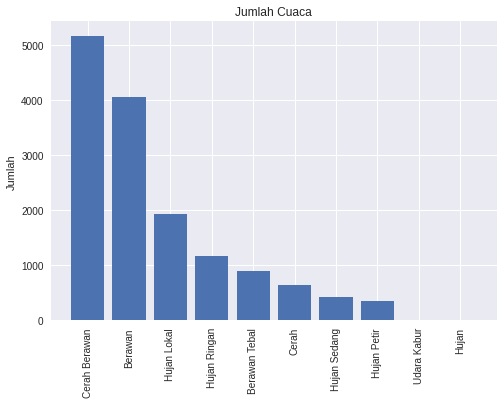

In [ ]:
df_cuaca = df['cuaca'].value_counts()
x_coords = np.arange(len(list(df_cuaca.index)))
plt.bar(x_coords, list(df_cuaca.values), tick_label=list(df_cuaca.index))
plt.xticks(rotation=90)
plt.ylabel('Jumlah')
plt.title('Jumlah Cuaca')
plt.show()

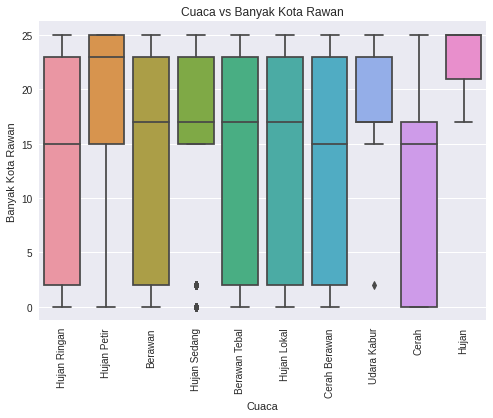

In [ ]:
sns.boxplot(data=df, x='cuaca', y='BanyakKotaRawan')
plt.ylabel("Banyak Kota Rawan")
plt.xlabel("Cuaca")
plt.title('Cuaca vs Banyak Kota Rawan')
plt.xticks(rotation=90)
plt.show()

# **Data Preprocessing - Handling Categorical Values**

Lihat tipe data untuk melihat kolom mana yang perlu ditransformasikan / encode. 

Dapat dilihat dari tipe datanya bahwa semua columns / features adalah object kecuali untuk kolom 'BanyakKotaRawan', yang merupakan data numerical

In [ ]:
df.dtypes

wilayah                 object
waktu                   object
cuaca                   object
kelembaban_persen       object
suhu_derajat_celcius    object
BanyakKotaRawan          int64
dtype: object

In [ ]:
df.to_csv('X_data.csv')

Encode data kategorikal untuk target (cuaca) dengan mengubah nilai di 'diagnosis' masing-masing dari 

|Cuaca|Label|
|----|----|
|'Berawan'|0|
|'Berawan Sedang'|1|
|'Berawan Tebal'|2|
|'Cerah'|3|
|'Cerah Berawan'|4| 
|'Hujan'|5|
|'Hujan Lokal'|6|
|'Hujan Petir'|7|
|'Hujan Ringan'|8|
|'Hujan Sedang'|9|
|'Udara Kabur'|10|

['Hujan Ringan' 'Hujan Petir' 'Berawan' 'Hujan Sedang' 'Berawan Tebal'
 'Hujan Lokal' 'Cerah Berawan' 'Udara Kabur' 'Cerah' 'Hujan']

 [7 6 0 8 1 5 3 9 2 4]



In [ ]:
target = {}
label = [7, 6, 0, 8, 1, 5, 3, 9, 2, 4]
for i, x in enumerate(['Hujan Ringan', 'Hujan Petir', 'Berawan', 'Hujan Sedang', 'Berawan Tebal', 'Hujan Lokal', 'Cerah Berawan', 'Udara Kabur', 'Cerah', 'Hujan']):
    target[x] = label[i]

target

{'Berawan': 0,
 'Berawan Tebal': 1,
 'Cerah': 2,
 'Cerah Berawan': 3,
 'Hujan': 4,
 'Hujan Lokal': 5,
 'Hujan Petir': 6,
 'Hujan Ringan': 7,
 'Hujan Sedang': 8,
 'Udara Kabur': 9}

In [ ]:
target = ['Berawan', 'Berawan Tebal', 'Cerah', 'Cerah Berawan', 'Hujan', 'Hujan Ringan', 'Hujan Lokal', 'Hujan Petir', 'Hujan Sedang', 'Udara Kabur']

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
le = LabelEncoder()

In [ ]:
print(df.cuaca.unique())
df[["cuaca"]].head()

['Hujan Ringan' 'Hujan Petir' 'Berawan' 'Hujan Sedang' 'Berawan Tebal'
 'Hujan Lokal' 'Cerah Berawan' 'Udara Kabur' 'Cerah' 'Hujan']


,cuaca
0,Hujan Ringan
1,Hujan Ringan
2,Hujan Ringan
3,Hujan Ringan
4,Hujan Ringan


In [ ]:
df.loc[:, ["cuaca"]] = le.fit_transform(df["cuaca"])
print(df.cuaca.unique())
df[["cuaca"]].head()

[7 6 0 8 1 5 3 9 2 4]


,cuaca
0,7
1,7
2,7
3,7
4,7


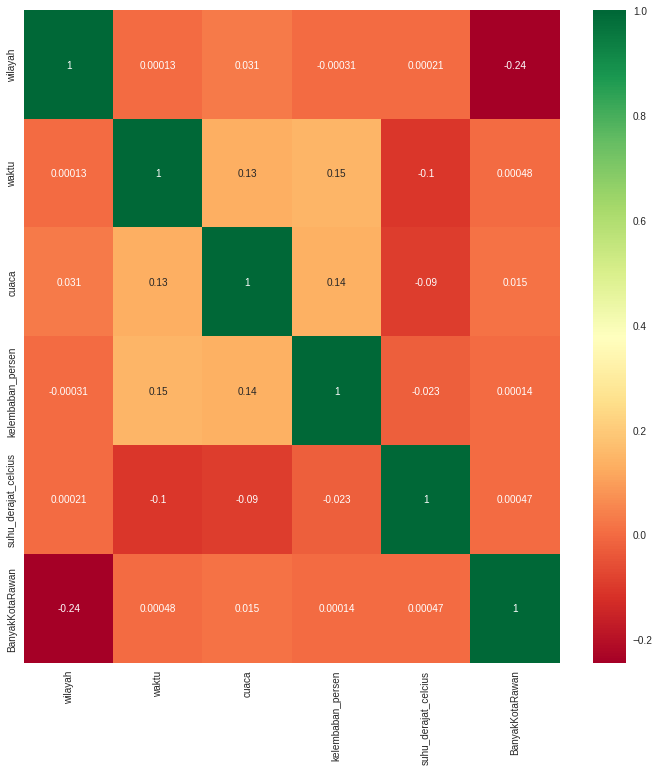

In [ ]:
col_cat = [x for x in df.columns if x not in ["cuaca", "BanyakKotaRawan"]]
df2 = df.copy()

for x in col_cat:
  df2.loc[:, [x]] = le.fit_transform(df2[x])

K = df2[col_cat]
j = df2["cuaca"]

# mendapatkan korelasi di setiap fitur dalam dataset
corrmat = df2.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(12,12))

# plot heatmap
h = sns.heatmap(df2[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [ ]:
col_cat = [x for x in df.columns if x not in ["cuaca", "BanyakKotaRawan"]]
col_cat

['wilayah', 'waktu', 'kelembaban_persen', 'suhu_derajat_celcius']

In [ ]:
for var in col_cat:
    cat_list = 'var'+'_'+var
    cat_list = pd.get_dummies(df[var], prefix=var)
    data1= df.join(cat_list)
    df=data1

In [ ]:
df.head()

,wilayah,waktu,cuaca,kelembaban_persen,suhu_derajat_celcius,BanyakKotaRawan,wilayah_Jakarta Barat,wilayah_Jakarta Pusat,wilayah_Jakarta Selatan,wilayah_Jakarta Timur,wilayah_Jakarta Utara,wilayah_Kepulauan Seribu,waktu_Dini Hari,waktu_Malam,waktu_Pagi,waktu_Siang,waktu_dini hari,waktu_malam,waktu_pagi,waktu_siang,kelembaban_persen_35-75,kelembaban_persen_35-80,kelembaban_persen_40-70,kelembaban_persen_40-75,kelembaban_persen_40-80,kelembaban_persen_40-85,kelembaban_persen_40-90,kelembaban_persen_40-95,kelembaban_persen_45-75,kelembaban_persen_45-80,kelembaban_persen_45-85,kelembaban_persen_45-90,kelembaban_persen_50-75,kelembaban_persen_50-80,kelembaban_persen_50-85,kelembaban_persen_50-90,kelembaban_persen_50-92,kelembaban_persen_50-95,kelembaban_persen_55-100,kelembaban_persen_55-75,...,kelembaban_persen_85-95,kelembaban_persen_90-95,kelembaban_persen_95-95,suhu_derajat_celcius_20-34,suhu_derajat_celcius_21-32,suhu_derajat_celcius_21-33,suhu_derajat_celcius_21-34,suhu_derajat_celcius_22-30,suhu_derajat_celcius_22-31,suhu_derajat_celcius_22-32,suhu_derajat_celcius_22-33,suhu_derajat_celcius_22-34,suhu_derajat_celcius_22-35,suhu_derajat_celcius_23-28,suhu_derajat_celcius_23-29,suhu_derajat_celcius_23-30,suhu_derajat_celcius_23-31,suhu_derajat_celcius_23-32,suhu_derajat_celcius_23-33,suhu_derajat_celcius_23-34,suhu_derajat_celcius_23-35,suhu_derajat_celcius_24-28,suhu_derajat_celcius_24-29,suhu_derajat_celcius_24-30,suhu_derajat_celcius_24-31,suhu_derajat_celcius_24-32,suhu_derajat_celcius_24-33,suhu_derajat_celcius_24-34,suhu_derajat_celcius_24-35,suhu_derajat_celcius_25-30,suhu_derajat_celcius_25-31,suhu_derajat_celcius_25-32,suhu_derajat_celcius_25-33,suhu_derajat_celcius_25-34,suhu_derajat_celcius_25-35,suhu_derajat_celcius_26-32,suhu_derajat_celcius_26-33,suhu_derajat_celcius_26-34,suhu_derajat_celcius_27-29,suhu_derajat_celcius_27-32
0,Jakarta Pusat,Pagi,7,65-95,22-31,2,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Kepulauan Seribu,Malam,7,65-95,22-31,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Jakarta Timur,Malam,7,65-95,22-31,23,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Jakarta Barat,Malam,7,65-95,22-31,17,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Jakarta Selatan,Malam,7,65-95,22-31,25,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
data_vars = df.columns.values.tolist()
to_keep = [i for i in data_vars if i not in col_cat]
df = df[to_keep].copy()
df.columns.values

array(['cuaca', 'BanyakKotaRawan', 'wilayah_Jakarta Barat',
       'wilayah_Jakarta Pusat', 'wilayah_Jakarta Selatan',
       'wilayah_Jakarta Timur', 'wilayah_Jakarta Utara',
       'wilayah_Kepulauan Seribu', 'waktu_Dini Hari', 'waktu_Malam',
       'waktu_Pagi', 'waktu_Siang', 'waktu_dini hari', 'waktu_malam',
       'waktu_pagi', 'waktu_siang', 'kelembaban_persen_35-75',
       'kelembaban_persen_35-80', 'kelembaban_persen_40-70',
       'kelembaban_persen_40-75', 'kelembaban_persen_40-80',
       'kelembaban_persen_40-85', 'kelembaban_persen_40-90',
       'kelembaban_persen_40-95', 'kelembaban_persen_45-75',
       'kelembaban_persen_45-80', 'kelembaban_persen_45-85',
       'kelembaban_persen_45-90', 'kelembaban_persen_50-75',
       'kelembaban_persen_50-80', 'kelembaban_persen_50-85',
       'kelembaban_persen_50-90', 'kelembaban_persen_50-92',
       'kelembaban_persen_50-95', 'kelembaban_persen_55-100',
       'kelembaban_persen_55-75', 'kelembaban_persen_55-80',
       'kel

# **Data Preprocessing - Split Data**

## **Prepare Feature and Label**

Selanjutnya melakukan spli dataset yang terdiri dari :

* `feature` data set biasa disebut independent data set (X), yakni columns 

* `target` data set also known as the dependent data set (Y) 

In [ ]:
X = df.drop(['cuaca'], axis = 1)
y = df[['cuaca']]

In [ ]:
X.head()

,BanyakKotaRawan,wilayah_Jakarta Barat,wilayah_Jakarta Pusat,wilayah_Jakarta Selatan,wilayah_Jakarta Timur,wilayah_Jakarta Utara,wilayah_Kepulauan Seribu,waktu_Dini Hari,waktu_Malam,waktu_Pagi,waktu_Siang,waktu_dini hari,waktu_malam,waktu_pagi,waktu_siang,kelembaban_persen_35-75,kelembaban_persen_35-80,kelembaban_persen_40-70,kelembaban_persen_40-75,kelembaban_persen_40-80,kelembaban_persen_40-85,kelembaban_persen_40-90,kelembaban_persen_40-95,kelembaban_persen_45-75,kelembaban_persen_45-80,kelembaban_persen_45-85,kelembaban_persen_45-90,kelembaban_persen_50-75,kelembaban_persen_50-80,kelembaban_persen_50-85,kelembaban_persen_50-90,kelembaban_persen_50-92,kelembaban_persen_50-95,kelembaban_persen_55-100,kelembaban_persen_55-75,kelembaban_persen_55-80,kelembaban_persen_55-85,kelembaban_persen_55-90,kelembaban_persen_55-95,kelembaban_persen_60-100,...,kelembaban_persen_85-95,kelembaban_persen_90-95,kelembaban_persen_95-95,suhu_derajat_celcius_20-34,suhu_derajat_celcius_21-32,suhu_derajat_celcius_21-33,suhu_derajat_celcius_21-34,suhu_derajat_celcius_22-30,suhu_derajat_celcius_22-31,suhu_derajat_celcius_22-32,suhu_derajat_celcius_22-33,suhu_derajat_celcius_22-34,suhu_derajat_celcius_22-35,suhu_derajat_celcius_23-28,suhu_derajat_celcius_23-29,suhu_derajat_celcius_23-30,suhu_derajat_celcius_23-31,suhu_derajat_celcius_23-32,suhu_derajat_celcius_23-33,suhu_derajat_celcius_23-34,suhu_derajat_celcius_23-35,suhu_derajat_celcius_24-28,suhu_derajat_celcius_24-29,suhu_derajat_celcius_24-30,suhu_derajat_celcius_24-31,suhu_derajat_celcius_24-32,suhu_derajat_celcius_24-33,suhu_derajat_celcius_24-34,suhu_derajat_celcius_24-35,suhu_derajat_celcius_25-30,suhu_derajat_celcius_25-31,suhu_derajat_celcius_25-32,suhu_derajat_celcius_25-33,suhu_derajat_celcius_25-34,suhu_derajat_celcius_25-35,suhu_derajat_celcius_26-32,suhu_derajat_celcius_26-33,suhu_derajat_celcius_26-34,suhu_derajat_celcius_27-29,suhu_derajat_celcius_27-32
0,2,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,23,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,17,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,25,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
y.head()

,cuaca
0,7
1,7
2,7
3,7
4,7


* Aplikasikan library **SelectKBest** untuk mengekstrak fitur terbaik dari dataset

In [ ]:
#Apply SelectKBest class to extract
bestfeature = SelectKBest(score_func=chi2, k=4)
fit = bestfeature.fit(X, y)

dfscores = pd.DataFrame(fit.scores_)
dfcolums = pd.DataFrame(X.columns)

* lihat hasil score seleksi feature

In [ ]:
#gabungkan 2 dataframe tersebut untuk visualisasi yang lebih bagus

featureScores = pd.concat([dfcolums, dfscores], axis=1)
featureScores.columns = ['Field', 'Score']
print(featureScores.nlargest(10,'Score'))

                         Field       Score
0              BanyakKotaRawan  815.296146
10                 waktu_Siang  311.954133
21     kelembaban_persen_40-90  291.982696
82  suhu_derajat_celcius_23-33  267.875156
87  suhu_derajat_celcius_24-30  265.752038
29     kelembaban_persen_50-85  256.753457
59    kelembaban_persen_80-100  255.801971
37     kelembaban_persen_55-90  250.261722
9                   waktu_Pagi  248.703710
86  suhu_derajat_celcius_24-29  248.168067


### Feature Importance (FT)
---
FT berfungsi memberi skor untuk setiap fitur data, semakin tinggi skor semakin penting atau relevan fitur tersebut terhadap variabel output

FT merupakan kelas inbuilt yang dilengkapi dengan Pengklasifikasi Berbasis Pohon (Tree Based Classifier), kita akan menggunakan Pengklasifikasi Pohon Ekstra untuk
mengekstraksi 10 fitur teratas untuk kumpulan data

Tujuan dari **ExtraTreesClassifier** adalah untuk menyesuaikan sejumlah pohon keputusan acak ke data, dan dalam hal ini adalah dari pembelajaran ensemble. Khususnya, pemisahan acak dari semua pengamatan dilakukan untuk memastikan bahwa model tidak terlalu cocok dengan data.

* Aplikasikan library **ExtraTreesClassifier** untuk mengekstrak fitur terbaik dari dataset

In [ ]:
# Import library ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesClassifier
# Import library matplotlib
import matplotlib.pyplot as plt 

# fit model ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X, y)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


ExtraTreesClassifier()

* visualisasikan hasil dari model ExtraTreesClassifier

[0.04424679 0.02268213 0.01554327 0.01874773 0.01689297 0.02167048
 0.0279177  0.01815979 0.01822384 0.01963925 0.01862187 0.00843304
 0.00782693 0.00856195 0.01024199 0.00263761 0.00223965 0.00226004
 0.0014347  0.00158601 0.00616231 0.00353031 0.001722   0.0025029
 0.01177953 0.008163   0.00477735 0.00190983 0.00536688 0.00840818
 0.00607223 0.00120755 0.00169798 0.00184396 0.00476975 0.0096772
 0.01482218 0.0128809  0.01291135 0.01084841 0.00392485 0.0111339
 0.01785401 0.01713212 0.01075484 0.00293295 0.00978861 0.01505074
 0.01757815 0.00110471 0.01012248 0.00410174 0.00496313 0.01876581
 0.01641952 0.0141383  0.00237628 0.00589575 0.01680206 0.01009281
 0.00392095 0.01364584 0.00478197 0.00566527 0.00774331 0.00359167
 0.00173989 0.00072239 0.00154988 0.00645963 0.00271122 0.00114074
 0.00544493 0.00791053 0.01164103 0.0055405  0.0011903  0.00397243
 0.0032139  0.00829599 0.01524895 0.01763083 0.0200506  0.01061178
 0.00272173 0.00356406 0.00821825 0.01097785 0.01248398 0.0282828

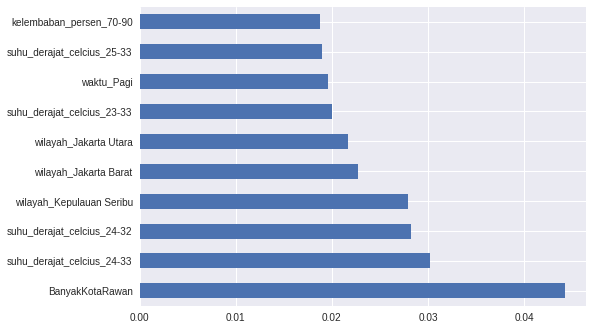

In [ ]:
print(model.feature_importances_)
feat_importance = pd.Series(model.feature_importances_, index=X.columns)
feat_importance.nlargest(10).plot(kind='barh')
plt.show()

## Split Data

Memisahkan data untuk training dan testing, tetapi kali ini menjadi 80% kumpulan data training dan 20% testing.

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y.iloc[:, 0], test_size=0.20, random_state=0, stratify=y.values.tolist())

In [ ]:
X_train

,BanyakKotaRawan,wilayah_Jakarta Barat,wilayah_Jakarta Pusat,wilayah_Jakarta Selatan,wilayah_Jakarta Timur,wilayah_Jakarta Utara,wilayah_Kepulauan Seribu,waktu_Dini Hari,waktu_Malam,waktu_Pagi,waktu_Siang,waktu_dini hari,waktu_malam,waktu_pagi,waktu_siang,kelembaban_persen_35-75,kelembaban_persen_35-80,kelembaban_persen_40-70,kelembaban_persen_40-75,kelembaban_persen_40-80,kelembaban_persen_40-85,kelembaban_persen_40-90,kelembaban_persen_40-95,kelembaban_persen_45-75,kelembaban_persen_45-80,kelembaban_persen_45-85,kelembaban_persen_45-90,kelembaban_persen_50-75,kelembaban_persen_50-80,kelembaban_persen_50-85,kelembaban_persen_50-90,kelembaban_persen_50-92,kelembaban_persen_50-95,kelembaban_persen_55-100,kelembaban_persen_55-75,kelembaban_persen_55-80,kelembaban_persen_55-85,kelembaban_persen_55-90,kelembaban_persen_55-95,kelembaban_persen_60-100,...,kelembaban_persen_85-95,kelembaban_persen_90-95,kelembaban_persen_95-95,suhu_derajat_celcius_20-34,suhu_derajat_celcius_21-32,suhu_derajat_celcius_21-33,suhu_derajat_celcius_21-34,suhu_derajat_celcius_22-30,suhu_derajat_celcius_22-31,suhu_derajat_celcius_22-32,suhu_derajat_celcius_22-33,suhu_derajat_celcius_22-34,suhu_derajat_celcius_22-35,suhu_derajat_celcius_23-28,suhu_derajat_celcius_23-29,suhu_derajat_celcius_23-30,suhu_derajat_celcius_23-31,suhu_derajat_celcius_23-32,suhu_derajat_celcius_23-33,suhu_derajat_celcius_23-34,suhu_derajat_celcius_23-35,suhu_derajat_celcius_24-28,suhu_derajat_celcius_24-29,suhu_derajat_celcius_24-30,suhu_derajat_celcius_24-31,suhu_derajat_celcius_24-32,suhu_derajat_celcius_24-33,suhu_derajat_celcius_24-34,suhu_derajat_celcius_24-35,suhu_derajat_celcius_25-30,suhu_derajat_celcius_25-31,suhu_derajat_celcius_25-32,suhu_derajat_celcius_25-33,suhu_derajat_celcius_25-34,suhu_derajat_celcius_25-35,suhu_derajat_celcius_26-32,suhu_derajat_celcius_26-33,suhu_derajat_celcius_26-34,suhu_derajat_celcius_27-29,suhu_derajat_celcius_27-32
7948,2,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14620,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6786,15,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3504,25,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2132,2,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12336,15,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6582,2,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
11149,25,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3145,2,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


# **Data Preprocessing - Normalize**

Scale the data to bring all features to the same level of magnitude, which means the feature / independent data will be within a specific range for example 0–100 or 0–1.

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
sc = StandardScaler()

In [ ]:
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

# **Remove Outlier**

In [ ]:
X = df.drop(['cuaca'], axis = 1)
y = df[['cuaca']]

**Identify Outlier**

In [ ]:
from sklearn.neighbors import LocalOutlierFactor

clf = LocalOutlierFactor()
y_pred = clf.fit_predict(X)

X_score = clf.negative_outlier_factor_
outlier_score = pd.DataFrame()
outlier_score["score"] = X_score
threshold = -2.5
filtre = outlier_score["score"] < threshold
outlier_index = outlier_score[filtre].index.tolist()

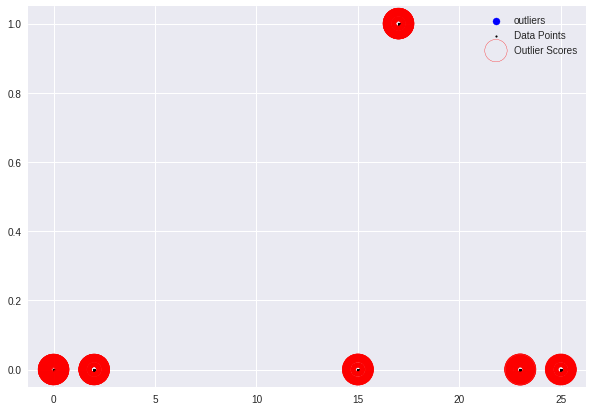

In [ ]:
plt.figure(figsize=(10,7))
plt.scatter(X.iloc[outlier_index,0],X.iloc[outlier_index,1],color = "blue", s = 50, label = "outliers")
plt.scatter(X.iloc[:,0],X.iloc[:,1],color = "k", s = 3, label = "Data Points")
radius = (X_score.max()- X_score) / (X_score.max() - X_score.min())
outlier_score["radius"] = radius
plt.scatter(X.iloc[:,0],X.iloc[:,1],s = 1000*radius, edgecolors = "r", facecolors = "none", label = "Outlier Scores")
plt.legend() 
plt.show()

In [ ]:
X = X.drop(outlier_index)
y = y.drop(outlier_index).values

**split data and normalize**

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0, stratify=y.tolist())

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
sc = StandardScaler()

In [ ]:
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

# Data Modelling

## **Logistic Regression**

### **Train Model**

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression()

### **Test Model**

In [ ]:
model_score = logreg.score(X_test, y_test)

In [ ]:
print('Model Accuracy:', model_score)

Model Accuracy: 0.43408469945355194


In [ ]:
logreg.coef_

array([[-0.07499896, -0.05288684,  0.09456709, ...,  0.06193103,
         0.07197002,  0.0310113 ],
       [-0.05095391, -0.02604612,  0.12187572, ...,  0.1267976 ,
        -0.12367882,  0.15003964],
       [-0.21663136, -0.12863065,  0.02761396, ...,  0.11646515,
         0.21328998, -0.06942581],
       ...,
       [-0.07727066, -0.07069857, -0.0265638 , ...,  0.00809671,
        -0.13324914, -0.1233139 ],
       [ 0.02265839,  0.01682465, -0.08389158, ..., -0.27692287,
        -0.08964148, -0.10951331],
       [ 0.23451279,  0.25404691,  0.27371079, ...,  0.05272921,
         0.07283779,  0.06119788]])

In [ ]:
logreg.intercept_

array([ 3.91493349,  1.3168414 ,  0.26195696,  3.95010606, -6.69735411,
        2.74046272, -0.58092423,  1.66700645, -0.01725833, -6.55577041])

### **Tuning Parameter**

In [ ]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import RepeatedStratifiedKFold

# model = LogisticRegression()
# max_iter = [100, 200]
# penalty = ['l1', 'l2']
# C = np.logspace(-4,4,20)
# solver = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']

# #Menjadikan ke dalam bentuk dictionary
# grid = dict(solver=solver, penalty=penalty, C=C, max_iter=max_iter)

# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
# grid_result = grid_search.fit(X_train, y_train)
# # summarize results
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))


In [ ]:
logreg = LogisticRegression(C=0.615848211066026, max_iter=100, penalty='l2', solver='saga')
logreg.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_sag.py:354: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  ConvergenceWarning,


LogisticRegression(C=0.615848211066026, solver='saga')

In [ ]:
model_score = logreg.score(X_test, y_test)

In [ ]:
print('Model Accuracy:', model_score)

Model Accuracy: 0.43510928961748635


In [ ]:
logreg.coef_

array([[-0.03843286,  0.00224637,  0.10463166, ...,  0.05521137,
         0.07420621,  0.01380269],
       [-0.01476442,  0.02927956,  0.13217226, ...,  0.11745052,
        -0.11800373,  0.13205443],
       [-0.17988489, -0.07466168,  0.0379129 , ...,  0.09843919,
         0.21004063, -0.05050466],
       ...,
       [-0.04110202, -0.0151979 , -0.01569001, ...,  0.00124206,
        -0.13125317, -0.12369994],
       [ 0.05850032,  0.07250353, -0.07391357, ..., -0.21654733,
        -0.06529455, -0.09231789],
       [ 0.10096809,  0.10976595,  0.08190595, ...,  0.01323429,
         0.04305119,  0.03511068]])

In [ ]:
logreg.intercept_

array([ 3.03569981,  0.54351276, -0.36290746,  3.07430298, -3.6972486 ,
        1.85367905, -1.04806525,  0.84239828, -0.5974694 , -3.64390218])

### **Visualize S-Curve**

In [ ]:
# from sklearn.metrics import roc_auc_score
# from sklearn.metrics import roc_curve
# logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
# fpr, tpr, threshols = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
# plt.figure()
# plt.plot(fpr, tpr, label ='Logistic Regression (Area=%0.2f)'%logit_roc_auc)
# plt.plot([0,1],[0,1],'r--')
# plt.xlim([0.0,1.0])
# plt.ylim([0.0,1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Cuaca')
# plt.legend(loc="lower right")
# plt.show()

### **Prediction**

In [ ]:
y_predict = logreg.predict(X_test)

### **Confusion matrix and f1 accuracy**

In [ ]:
from sklearn import metrics
from sklearn.metrics import f1_score, confusion_matrix, accuracy_score

Accuracy is: 0.43510928961748635


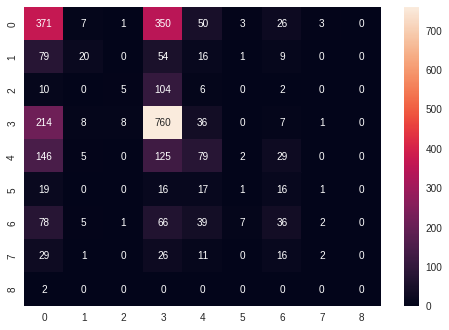

In [ ]:
ac= accuracy_score(y_test, y_predict)
print('Accuracy is:', ac)
cm = confusion_matrix(y_test,y_predict)
sns.heatmap(cm,annot=True,fmt='d')

In [ ]:
target_is = ["is " + x for x in target if not str(x) == "nan"]
target_predict = ["predicted " + x for x in target if not str(x) == "nan"]
from sklearn.metrics import classification_report, confusion_matrix
cm = np.array(confusion_matrix(y_test, y_predict, labels=range(len(target))))
confusion = pd.DataFrame(cm, index=target_is,
                         columns=target_predict)
confusion

,predicted Berawan,predicted Berawan Tebal,predicted Cerah,predicted Cerah Berawan,predicted Hujan,predicted Hujan Ringan,predicted Hujan Lokal,predicted Hujan Petir,predicted Hujan Sedang,predicted Udara Kabur
is Berawan,371,7,1,350,0,50,3,26,3,0
is Berawan Tebal,79,20,0,54,0,16,1,9,0,0
is Cerah,10,0,5,104,0,6,0,2,0,0
is Cerah Berawan,214,8,8,760,0,36,0,7,1,0
is Hujan,0,0,0,0,0,0,0,0,0,0
is Hujan Ringan,146,5,0,125,0,79,2,29,0,0
is Hujan Lokal,19,0,0,16,0,17,1,16,1,0
is Hujan Petir,78,5,1,66,0,39,7,36,2,0
is Hujan Sedang,29,1,0,26,0,11,0,16,2,0
is Udara Kabur,2,0,0,0,0,0,0,0,0,0


In [ ]:
print('Acc',classification_report(y_test,y_predict))

Acc               precision    recall  f1-score   support

           0       0.39      0.46      0.42       811
           1       0.43      0.11      0.18       179
           2       0.33      0.04      0.07       127
           3       0.51      0.74      0.60      1034
           5       0.31      0.20      0.25       386
           6       0.07      0.01      0.02        70
           7       0.26      0.15      0.19       234
           8       0.22      0.02      0.04        85
           9       0.00      0.00      0.00         2

    accuracy                           0.44      2928
   macro avg       0.28      0.19      0.20      2928
weighted avg       0.40      0.44      0.39      2928



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Support Vector Machines (SVM)**

### **Train Model**

In [ ]:
from sklearn import svm

In [ ]:
svm_model = svm.SVC()

In [ ]:
svm_model.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC()

### **Test Model**

In [ ]:
svm_score = svm_model.score(X_test, y_test)

In [ ]:
print('Model Accuracy:', svm_score)

Model Accuracy: 0.4880464480874317


### **Tuning Parameter**

In [ ]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import RepeatedStratifiedKFold

# model = svm.SVC()
# kernel = ['poly', 'rbf', 'sigmoid', 'linear']
# C = np.logspace(-4,4,20)
# gamma = ['scale', 'auto', 100, 1, 0.1, 0.01, 0.001]

# #Menjadikan ke dalam bentuk dictionary
# grid = dict(kernel=kernel,C=C,gamma=gamma)

# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
# grid_result = grid_search.fit(X_train, y_train)
# # summarize results
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))


In [ ]:
svm_model = svm.SVC(C=11.288378916846883, gamma=0.01, kernel='rbf')

In [ ]:
svm_model.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:985: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(C=11.288378916846883, gamma=0.01)

In [ ]:
svm_score = svm_model.score(X_test, y_test)

In [ ]:
print('Model Accuracy:', svm_score)

Model Accuracy: 0.5327868852459017


### **Prediction**

In [ ]:
y_predict = svm_model.predict(X_test)

### **Confusion matrix and f1 accuracy**

In [ ]:
from sklearn import metrics
from sklearn.metrics import f1_score, confusion_matrix, accuracy_score

Accuracy is: 0.5327868852459017


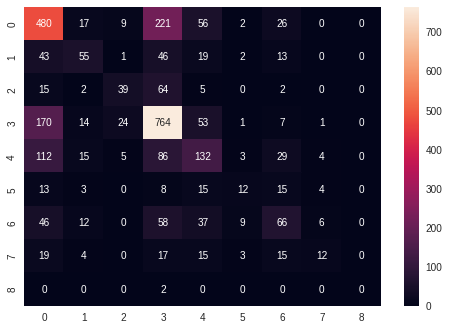

In [ ]:
ac= accuracy_score(y_test, y_predict)
print('Accuracy is:', ac)
cm = confusion_matrix(y_test,y_predict)
sns.heatmap(cm,annot=True,fmt='d')

In [ ]:
target_is = ["is " + x for x in target if not str(x) == "nan"]
target_predict = ["predicted " + x for x in target if not str(x) == "nan"]
from sklearn.metrics import classification_report, confusion_matrix
cm = np.array(confusion_matrix(y_test, y_predict, labels=range(len(target))))
confusion = pd.DataFrame(cm, index=target_is,
                         columns=target_predict)
confusion

,predicted Berawan,predicted Berawan Tebal,predicted Cerah,predicted Cerah Berawan,predicted Hujan,predicted Hujan Ringan,predicted Hujan Lokal,predicted Hujan Petir,predicted Hujan Sedang,predicted Udara Kabur
is Berawan,480,17,9,221,0,56,2,26,0,0
is Berawan Tebal,43,55,1,46,0,19,2,13,0,0
is Cerah,15,2,39,64,0,5,0,2,0,0
is Cerah Berawan,170,14,24,764,0,53,1,7,1,0
is Hujan,0,0,0,0,0,0,0,0,0,0
is Hujan Ringan,112,15,5,86,0,132,3,29,4,0
is Hujan Lokal,13,3,0,8,0,15,12,15,4,0
is Hujan Petir,46,12,0,58,0,37,9,66,6,0
is Hujan Sedang,19,4,0,17,0,15,3,15,12,0
is Udara Kabur,0,0,0,2,0,0,0,0,0,0


In [ ]:
print('Acc',classification_report(y_test,y_predict))

Acc               precision    recall  f1-score   support

           0       0.53      0.59      0.56       811
           1       0.45      0.31      0.37       179
           2       0.50      0.31      0.38       127
           3       0.60      0.74      0.66      1034
           5       0.40      0.34      0.37       386
           6       0.38      0.17      0.24        70
           7       0.38      0.28      0.32       234
           8       0.44      0.14      0.21        85
           9       0.00      0.00      0.00         2

    accuracy                           0.53      2928
   macro avg       0.41      0.32      0.35      2928
weighted avg       0.52      0.53      0.52      2928



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Decision Tree**

### **Train Model**

In [ ]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [ ]:
clf_entropy = DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=5)
clf_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=5)

### **Test Model**

In [ ]:
model_score = clf_entropy.score(X_test,y_test)

In [ ]:
print('Model Accuracy:', model_score)

Model Accuracy: 0.3637295081967213


### **Prediction**

In [ ]:
y_predict = clf_entropy.predict(X_test)

In [ ]:
y_predict

array([0, 3, 0, ..., 0, 0, 3])

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
print('Accuracy score:', accuracy_score(y_test,y_predict))

Accuracy score: 0.3637295081967213


In [ ]:
clf_entropy.feature_importances_

array([0.23565015, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.20612136, 0.        , 0.        , 0.22096793,
       0.23948066, 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.0977799 ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

### **Tuning Parameter**

In [ ]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import RepeatedStratifiedKFold
# from scipy.stats import randint

# model = DecisionTreeClassifier()

# criterion= ['entropy']
# max_depth= np.linspace(1, 32, 32, endpoint=True)
# min_samples_leafs = np.linspace(0.1, 0.5, 5, endpoint=True)
# min_samples_splits = np.linspace(0.1, 1.0, 10, endpoint=True)

# #Menjadikan ke dalam bentuk dictionary
# grid = dict(criterion=criterion, max_depth=max_depth, min_samples_leaf=min_samples_leafs, min_samples_split=min_samples_splits)

# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
# grid_result = grid_search.fit(X_train, y_train)
# # summarize results
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

In [ ]:
clf_entropy_tuning = DecisionTreeClassifier(criterion='entropy', max_depth=1.0, min_samples_leaf=0.1, min_samples_split=0.1)
clf_entropy_tuning.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=1.0, min_samples_leaf=0.1,
                       min_samples_split=0.1)

In [ ]:
model_score = clf_entropy_tuning.score(X_test,y_test)

In [ ]:
print('Model Accuracy:', model_score)

Model Accuracy: 0.3531420765027322


In [ ]:
y_predict = clf_entropy_tuning.predict(X_test)

In [ ]:
print('Accuracy score:', accuracy_score(y_test,y_predict))

Accuracy score: 0.3531420765027322


### **Display the Tree**

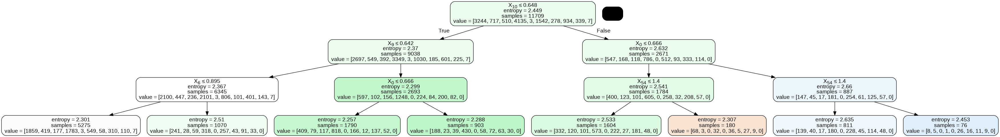

In [ ]:
from sklearn.tree import export_graphviz
from six import StringIO
# from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
dot_data = StringIO()
export_graphviz(clf_entropy, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('brestcancer.png')
Image(graph.create_png())

### **Confusion matrix and f1 accuracy**

In [ ]:
from sklearn import metrics
from sklearn.metrics import f1_score, confusion_matrix, accuracy_score

Accuracy is: 0.3531420765027322


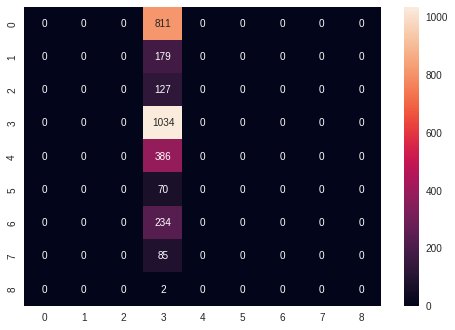

In [ ]:
ac= accuracy_score(y_test, y_predict)
print('Accuracy is:', ac)
cm = confusion_matrix(y_test,y_predict)
sns.heatmap(cm,annot=True,fmt='d')

In [ ]:
target_is = ["is " + x for x in target if not str(x) == "nan"]
target_predict = ["predicted " + x for x in target if not str(x) == "nan"]
from sklearn.metrics import classification_report, confusion_matrix
cm = np.array(confusion_matrix(y_test, y_predict, labels=range(len(target))))
confusion = pd.DataFrame(cm, index=target_is,
                         columns=target_predict)
confusion

,predicted Berawan,predicted Berawan Tebal,predicted Cerah,predicted Cerah Berawan,predicted Hujan,predicted Hujan Ringan,predicted Hujan Lokal,predicted Hujan Petir,predicted Hujan Sedang,predicted Udara Kabur
is Berawan,0,0,0,811,0,0,0,0,0,0
is Berawan Tebal,0,0,0,179,0,0,0,0,0,0
is Cerah,0,0,0,127,0,0,0,0,0,0
is Cerah Berawan,0,0,0,1034,0,0,0,0,0,0
is Hujan,0,0,0,0,0,0,0,0,0,0
is Hujan Ringan,0,0,0,386,0,0,0,0,0,0
is Hujan Lokal,0,0,0,70,0,0,0,0,0,0
is Hujan Petir,0,0,0,234,0,0,0,0,0,0
is Hujan Sedang,0,0,0,85,0,0,0,0,0,0
is Udara Kabur,0,0,0,2,0,0,0,0,0,0


In [ ]:
print('Acc',classification_report(y_test,y_predict))

Acc               precision    recall  f1-score   support

           0       0.00      0.00      0.00       811
           1       0.00      0.00      0.00       179
           2       0.00      0.00      0.00       127
           3       0.35      1.00      0.52      1034
           5       0.00      0.00      0.00       386
           6       0.00      0.00      0.00        70
           7       0.00      0.00      0.00       234
           8       0.00      0.00      0.00        85
           9       0.00      0.00      0.00         2

    accuracy                           0.35      2928
   macro avg       0.04      0.11      0.06      2928
weighted avg       0.12      0.35      0.18      2928



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## **Random Forest**

### **Train Model**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_clf = RandomForestClassifier()
rf_clf.fit(X_train,y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier()

### **Test Model**

In [ ]:
model_score = rf_clf.score(X_test,y_test)

In [ ]:
print('Model Accuracy:', model_score)

Model Accuracy: 0.47062841530054644


### **Tuning Parameter**

In [ ]:
# from sklearn.model_selection import GridSearchCV
# from sklearn.model_selection import RepeatedStratifiedKFold

# model = RandomForestClassifier()

# bootstrap = [True, False],
# n_estimators = [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]
# max_features = ['auto', 'sqrt', 'log2']
# max_depth = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None]
# min_samples_leaf = [1, 2, 4]
# min_samples_split = [2, 5, 10]

# #Menjadikan ke dalam bentuk dictionary
# grid = dict(bootstrap=bootstrap, n_estimators=n_estimators,max_features=max_features, max_depth=max_depth, min_samples_leaf=min_samples_leaf)

# cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
# grid_result = grid_search.fit(X_train, y_train)
# # summarize results
# print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
# means = grid_result.cv_results_['mean_test_score']
# stds = grid_result.cv_results_['std_test_score']
# params = grid_result.cv_results_['params']
# for mean, stdev, param in zip(means, stds, params):
#     print("%f (%f) with: %r" % (mean, stdev, param))

### **Check Importance Score**

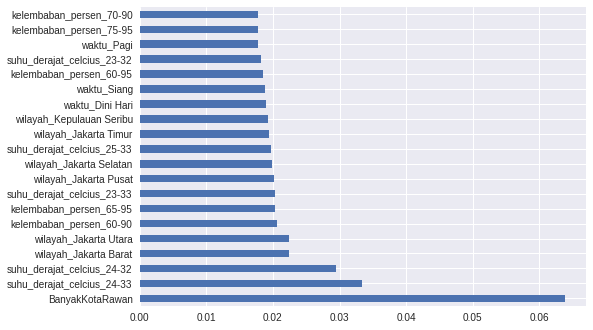

In [ ]:
features = np.array(df.drop(['cuaca'], axis = 1).columns)
importance_score = rf_clf.feature_importances_
indices = np.argsort(importance_score)

feature_importances = pd.Series(rf_clf.feature_importances_, index=features)
feature_importances.nlargest(20).plot(kind='barh')

### **Predition**

In [ ]:
y_predict = rf_clf.predict(X_test)

### **Display the Tree**

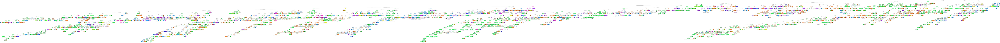

In [ ]:
from sklearn.tree import export_graphviz

estimator = rf_clf.estimators_[0]

export_graphviz(estimator, rounded=True, proportion=False, out_file='tree.dot',
                feature_names=X.columns, precision=2, filled=True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')

### **Confusion matrix and f1 accuracy**

In [ ]:
from sklearn import metrics
from sklearn.metrics import f1_score, confusion_matrix, accuracy_score

Accuracy is: 0.47062841530054644


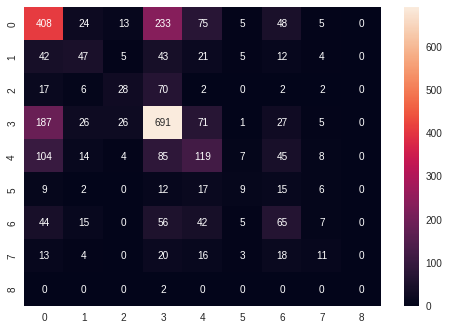

In [ ]:
ac= accuracy_score(y_test, y_predict)
print('Accuracy is:', ac)
cm = confusion_matrix(y_test,y_predict)
sns.heatmap(cm,annot=True,fmt='d')

In [ ]:
target_is = ["is " + x for x in target if not str(x) == "nan"]
target_predict = ["predicted " + x for x in target if not str(x) == "nan"]
from sklearn.metrics import classification_report, confusion_matrix
cm = np.array(confusion_matrix(y_test, y_predict, labels=range(len(target))))
confusion = pd.DataFrame(cm, index=target_is,
                         columns=target_predict)
confusion

,predicted Berawan,predicted Berawan Tebal,predicted Cerah,predicted Cerah Berawan,predicted Hujan,predicted Hujan Ringan,predicted Hujan Lokal,predicted Hujan Petir,predicted Hujan Sedang,predicted Udara Kabur
is Berawan,408,24,13,233,0,75,5,48,5,0
is Berawan Tebal,42,47,5,43,0,21,5,12,4,0
is Cerah,17,6,28,70,0,2,0,2,2,0
is Cerah Berawan,187,26,26,691,0,71,1,27,5,0
is Hujan,0,0,0,0,0,0,0,0,0,0
is Hujan Ringan,104,14,4,85,0,119,7,45,8,0
is Hujan Lokal,9,2,0,12,0,17,9,15,6,0
is Hujan Petir,44,15,0,56,0,42,5,65,7,0
is Hujan Sedang,13,4,0,20,0,16,3,18,11,0
is Udara Kabur,0,0,0,2,0,0,0,0,0,0


In [ ]:
print('Acc',classification_report(y_test,y_predict))

Acc               precision    recall  f1-score   support

           0       0.50      0.50      0.50       811
           1       0.34      0.26      0.30       179
           2       0.37      0.22      0.28       127
           3       0.57      0.67      0.62      1034
           5       0.33      0.31      0.32       386
           6       0.26      0.13      0.17        70
           7       0.28      0.28      0.28       234
           8       0.23      0.13      0.17        85
           9       0.00      0.00      0.00         2

    accuracy                           0.47      2928
   macro avg       0.32      0.28      0.29      2928
weighted avg       0.45      0.47      0.46      2928



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# **Save Model**

In [ ]:
import pickle

In [ ]:
pkl_filename = ["logreg.pkl", "svm_model.pkl", "desicion_tree.pkl", "random_forest.pkl"]
model = [logreg, svm_model, clf_entropy, rf_clf]

In [ ]:
for i in range(len(model)):
  with open(pkl_filename[i],'wb') as file:
    pickle.dump(model[i],file)

# **Conclusion Result**

In [ ]:
model = {
    "Logistic Regression": logreg, 
    "Support Vector Machine (Classifier)": svm_model, 
    "Decision Tree Classifier": clf_entropy, 
    "Random Forest Classifier": rf_clf
}

In [ ]:
for name, model_type in model.items():
    print(name, 'Training Accuracy:', model_type.score(X_train, y_train))

Logistic Regression Training Accuracy: 0.46032966094457256
Support Vector Machine (Classifier) Training Accuracy: 0.67384063540866
Decision Tree Classifier Training Accuracy: 0.3689469638739431
Random Forest Classifier Training Accuracy: 0.7338799214279614


In [ ]:
for name, model_type in model.items():
    print(name, 'Testing Accuracy:', model_type.score(X_test, y_test))

Logistic Regression Testing Accuracy: 0.43510928961748635
Support Vector Machine (Classifier) Testing Accuracy: 0.5327868852459017
Decision Tree Classifier Testing Accuracy: 0.3637295081967213
Random Forest Classifier Testing Accuracy: 0.47062841530054644


**Confusion matrix and f1 accuracy**

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

target_is = ["is " + x for x in target if not str(x) == "nan"]
target_predict = ["predicted " + x for x in target if not str(x) == "nan"]

for name, model_type in model.items():
  print("\n-------",name,"-------\n")
  y_predict = model_type.predict(X_test)
  cm = np.array(confusion_matrix(y_test, y_predict, labels=range(len(target))))
  confusion = pd.DataFrame(cm, index=target_is, columns=target_predict)
  print(confusion)


------- Logistic Regression -------

                  predicted Berawan  ...  predicted Udara Kabur
is Berawan                      371  ...                      0
is Berawan Tebal                 79  ...                      0
is Cerah                         10  ...                      0
is Cerah Berawan                214  ...                      0
is Hujan                          0  ...                      0
is Hujan Ringan                 146  ...                      0
is Hujan Lokal                   19  ...                      0
is Hujan Petir                   78  ...                      0
is Hujan Sedang                  29  ...                      0
is Udara Kabur                    2  ...                      0

[10 rows x 10 columns]

------- Support Vector Machine (Classifier) -------

                  predicted Berawan  ...  predicted Udara Kabur
is Berawan                      480  ...                      0
is Berawan Tebal                 43  ...            

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

for name, model_type in model.items():
  print("\n-------",name,"-------\n")
  y_predict = model_type.predict(X_test)
  print(classification_report(y_test,y_predict))


------- Logistic Regression -------

              precision    recall  f1-score   support

           0       0.39      0.46      0.42       811
           1       0.43      0.11      0.18       179
           2       0.33      0.04      0.07       127
           3       0.51      0.74      0.60      1034
           5       0.31      0.20      0.25       386
           6       0.07      0.01      0.02        70
           7       0.26      0.15      0.19       234
           8       0.22      0.02      0.04        85
           9       0.00      0.00      0.00         2

    accuracy                           0.44      2928
   macro avg       0.28      0.19      0.20      2928
weighted avg       0.40      0.44      0.39      2928


------- Support Vector Machine (Classifier) -------



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.53      0.59      0.56       811
           1       0.45      0.31      0.37       179
           2       0.50      0.31      0.38       127
           3       0.60      0.74      0.66      1034
           5       0.40      0.34      0.37       386
           6       0.38      0.17      0.24        70
           7       0.38      0.28      0.32       234
           8       0.44      0.14      0.21        85
           9       0.00      0.00      0.00         2

    accuracy                           0.53      2928
   macro avg       0.41      0.32      0.35      2928
weighted avg       0.52      0.53      0.52      2928


------- Decision Tree Classifier -------

              precision    recall  f1-score   support

           0       0.36      0.60      0.45       811
           1       0.00      0.00      0.00       179
           2       0.00      0.00      0.00       127
           3       0.39      0.50  

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

# **Deep Learning**

In [ ]:
import tensorflow as tf

from keras.models import Sequential
from keras.layers import Dense

In [ ]:
model = Sequential([
    Dense(128, activation = 'relu', input_shape=(104,)),
    Dense(64, activation = 'relu'),
    Dense(32, activation = 'relu'),
    Dense(10, activation = 'softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               13440     
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dense_3 (Dense)             (None, 10)                330       
                                                                 
Total params: 24,106
Trainable params: 24,106
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(
    optimizer = 'Adam',
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)

In [ ]:
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
# simple early stopping
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=50)

In [ ]:
mc = ModelCheckpoint('deeplearning.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

In [ ]:
history = model.fit(
    X_train, 
    y_train, 
    validation_data=(X_test, y_test), 
    epochs=500, 
    batch_size=len(X_train), 
    callbacks=[es, mc], 
    verbose=1
)

history.history['accuracy'][-1]

Epoch 1/500
1/1 [==============================] - ETA: 0s - loss: 2.4292 - accuracy: 0.0453
Epoch 00001: val_accuracy improved from -inf to 0.08333, saving model to deeplearning.h5
1/1 [==============================] - 3s 3s/step - loss: 2.4292 - accuracy: 0.0453 - val_loss: 2.3202 - val_accuracy: 0.0833
Epoch 2/500
1/1 [==============================] - ETA: 0s - loss: 2.3221 - accuracy: 0.0815
Epoch 00002: val_accuracy improved from 0.08333 to 0.15130, saving model to deeplearning.h5
1/1 [==============================] - 0s 93ms/step - loss: 2.3221 - accuracy: 0.0815 - val_loss: 2.2287 - val_accuracy: 0.1513
Epoch 3/500
1/1 [==============================] - ETA: 0s - loss: 2.2297 - accuracy: 0.1420
Epoch 00003: val_accuracy improved from 0.15130 to 0.22199, saving model to deeplearning.h5
1/1 [==============================] - 0s 86ms/step - loss: 2.2297 - accuracy: 0.1420 - val_loss: 2.1499 - val_accuracy: 0.2220
Epoch 4/500
1/1 [==============================] - ETA: 0s - loss:

0.6627380847930908

In [ ]:
_, train_acc = model.evaluate(X_train, y_train, verbose=0)
_, valid_acc = model.evaluate(X_test, y_test, verbose=0)
print('Train: %.3f, Valid: %.3f' % (train_acc, valid_acc))

Train: 0.665, Valid: 0.504


In [ ]:
from keras.models import load_model
saved_model = load_model('deeplearning.h5')
_, train_acc = saved_model.evaluate(X_train, y_train, verbose=0)
_, valid_acc = saved_model.evaluate(X_test, y_test, verbose=0)
print('Train: %.3f, Valid: %.3f' % (train_acc, valid_acc))

Train: 0.638, Valid: 0.518


## -- Plot Model

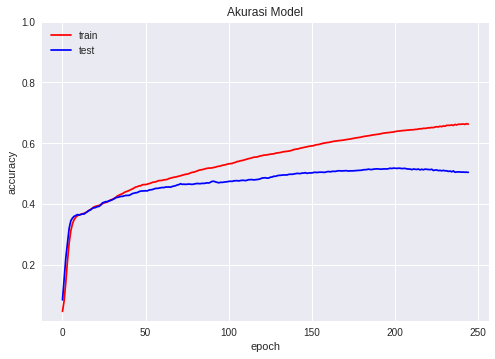

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'], color='red')
plt.plot(history.history['val_accuracy'], color='blue')
plt.ylim(top=1)
plt.title('Akurasi Model')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

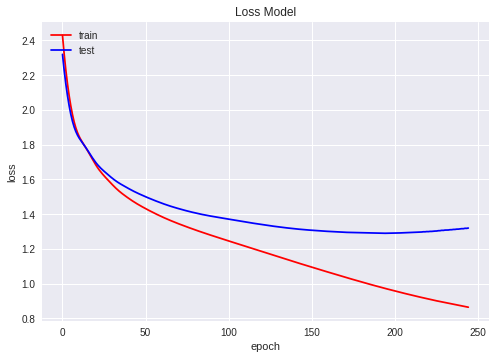

In [ ]:
plt.plot(history.history['loss'], color='red')
plt.plot(history.history['val_loss'], color='blue')
plt.title('Loss Model')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
import os
import pandas as pd
from flask import Flask, jsonify, request
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import tensorflow_hub as tfhub
import numpy as np

model = load_model("deeplearning.h5", custom_objects={
                       'KerasLayer': tfhub.KerasLayer})

wilayah = "Jakarta Pusat"
waktu = "Pagi"
kelembaban_persen = "65-95"
suhu_derajat_celsius = "22-31"
banyakkotarawan = 5
items = ['wilayah', 'waktu', 'kelembaban_persen', 'suhu_derajat_celcius', 'BanyakKotaRawan']
data = [[wilayah, waktu, kelembaban_persen, suhu_derajat_celsius, banyakkotarawan]]
data_df = pd.DataFrame(data=data, columns=items)

X_df = pd.read_csv("X_data.csv", usecols=items)
predict_df = pd.concat([data_df, X_df])

col_cat = [x for x in predict_df.columns if x not in ["BanyakKotaRawan"]]

for var in col_cat:
    cat_list = 'var'+'_'+var
    cat_list = pd.get_dummies(predict_df[var], prefix=var)
    data1= predict_df.join(cat_list)
    predict_df=data1

data_vars = predict_df.columns.values.tolist()
to_keep = [i for i in data_vars if i not in col_cat]
predict_df = predict_df[to_keep].copy()

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
predict_df = pd.DataFrame(StandardScaler().fit_transform(predict_df), columns=predict_df.columns, index=predict_df.index)


predictions = model.predict(predict_df.iloc[[0], :])

predicted_class_indices=np.argmax(predictions)

target = ['Berawan', 'Berawan Tebal', 'Cerah', 'Cerah Berawan', 
          'Hujan', 'Hujan Ringan', 'Hujan Lokal', 'Hujan Petir', 
          'Hujan Sedang', 'Udara Kabur']

print(target[predicted_class_indices])

Cerah Berawan
